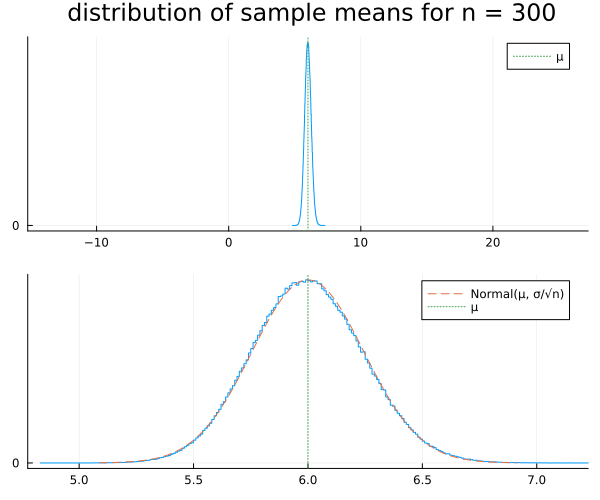

In [1]:
using Distributions
using StatsPlots
default(fmt=:png)

dist = Gamma(2, 3)
μ, σ = mean(dist), std(dist)
n = 300

L = 10^6
X̄ = zeros(L)
Threads.@threads for i in 1:L
    X = rand(dist, n)
    X̄[i] = mean(X)
end

P = stephist(X̄; norm=true, label="")
plot!(xlim=(μ-5σ, μ+5σ))
vline!([μ]; label="μ", ls=:dot, c=3)
plot!(ytick=[0])

Q = stephist(X̄; norm=true, label="")
plot!(xlim=(μ-5σ/√n, μ+5σ/√n))
plot!(Normal(μ, σ/√n); label="Normal(μ, σ/√n)", ls=:dash)
vline!([μ]; label="μ", ls=:dot)
plot!(ytick=[0])

plot(P, Q; size=(600, 500), layout=(2, 1))
plot!(plot_title="distribution of sample means for n = $n")

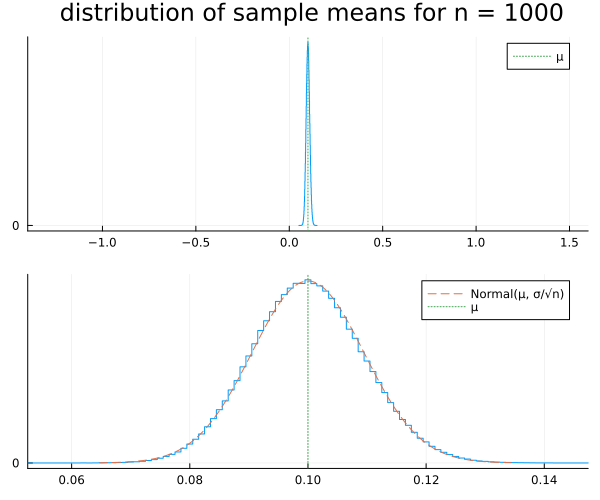

In [2]:
using Distributions
using StatsPlots
default(fmt=:png)

dist = Poisson(1)
dist = Bernoulli(0.1)
m = 5

μ, σ = mean(dist), std(dist)
n = 1000

L = 10^6
X̄ = zeros(L)
Threads.@threads for i in 1:L
    X = rand(dist, n)
    X̄[i] = mean(X)
end

nbin = 101
binmin, binmax = floor(n*(μ-m*σ/√n))/n, ceil(n*(μ+m*σ/√n))/n
binstep = max(1, round(n*(binmax - binmin)/nbin))/n
bin = binmin-binstep/2:binstep:binmax+binstep/2

P = stephist(X̄; norm=true, bin, label="")
plot!(xlim=(μ-m*σ, μ+m*σ))
vline!([μ]; label="μ", ls=:dot, c=3)
plot!(ytick=[0])

Q = stephist(X̄; norm=true, bin, label="")
plot!(xlim=(μ-m*σ/√n, μ+m*σ/√n))
plot!(Normal(μ, σ/√n); label="Normal(μ, σ/√n)", ls=:dash)
vline!([μ]; label="μ", ls=:dot)
plot!(ytick=[0])

plot(P, Q; size=(600, 500), layout=(2, 1))
plot!(plot_title="distribution of sample means for n = $n")

In [3]:
using Distributions
using Random
using StatsPlots
default(fmt=:png)

function plot_lln_clt(; dist=Gamma(2, 3), m=5, nbin=200, L=10^6)
    μ, σ = mean(dist), std(dist)
    ns = round.(Int, exp.(range(log(1), log(1000), 200)))
    nmax = maximum(ns)

    X̄ = zeros(L, length(ns))
    Xtmp = [zeros(eltype(dist), nmax) for _ in 1:Threads.nthreads()]
    @time Threads.@threads for i in 1:L
        X = rand!(dist, Xtmp[Threads.threadid()])
        for (j, n) in enumerate(ns)
            X̄[i, j] = mean(@view(X[1:n]))
        end
    end

    js = collect(eachindex(ns))
    js_gif = [fill(js[begin], 60); js; fill(js[end], 60)]
    ns_gif = ns[js_gif]
    @time @gif for (j, n) in zip(js_gif, ns_gif)
        bin = if dist isa DiscreteUnivariateDistribution
            binmin, binmax = floor(n*(μ-m*σ/√n))/n, ceil(n*(μ+m*σ/√n))/n
            binstep = max(1, round(n*(binmax - binmin)/nbin))/n
            binmin-binstep/2:binstep:binmax+binstep/2
        else
            :auto
        end
        
        P = stephist(@view(X̄[:, j]); norm=true, bin, label="")
        plot!(xlim=(μ-m*σ, μ+m*σ))
        vline!([μ]; label="μ", ls=:dot, c=3)
        title!("law of large numbers (n = $n)"; titlefontsize=12)
        plot!(ytick=[0])

        Q = stephist(@view(X̄[:, j]); norm=true, bin, label="")
        plot!(xlim=(μ-m*σ/√n, μ+m*σ/√n))
        plot!(Normal(μ, σ/√n), μ-m*σ/√n, μ+m*σ/√n; label="Normal(μ, σ/√n)", ls=:dash)
        vline!([μ]; label="μ", ls=:dot)
        title!("central limit theorem (n = $n)"; titlefontsize=12)
        plot!(ytick=[0])

        plot(P, Q; size=(600, 500), layout=(2, 1))
        plot!(plot_title="distribution of sample means for n = $n",
            plot_titlefontsize=14)
    end
end

plot_lln_clt (generic function with 1 method)

  1.218599 seconds (208.14 k allocations: 14.113 MiB, 177.89% compilation time)
 56.691838 seconds (16.77 M allocations: 15.010 GiB, 2.13% gc time, 1.85% compilation time: 56% of which was recompilation)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
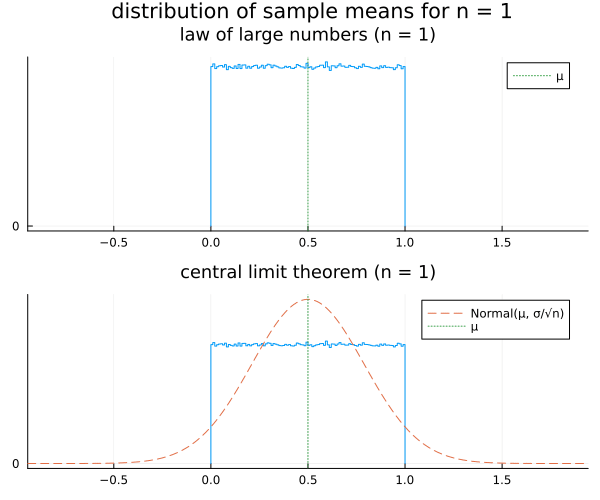

In [4]:
plot_lln_clt(; dist = Uniform())

  4.465495 seconds (64.02 k allocations: 4.303 MiB, 14.32% compilation time)
 52.582932 seconds (21.26 M allocations: 15.079 GiB, 2.11% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
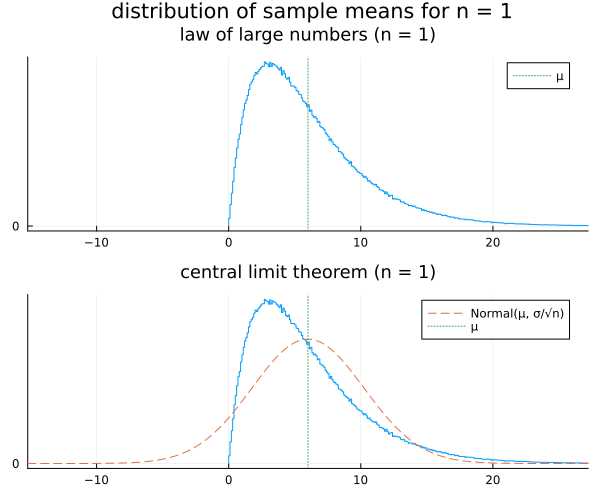

In [5]:
plot_lln_clt(; dist = Gamma(2, 3))

  8.335706 seconds (5.14 M allocations: 406.340 MiB, 465.67% compilation time)
 54.026952 seconds (19.22 M allocations: 15.049 GiB, 2.14% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
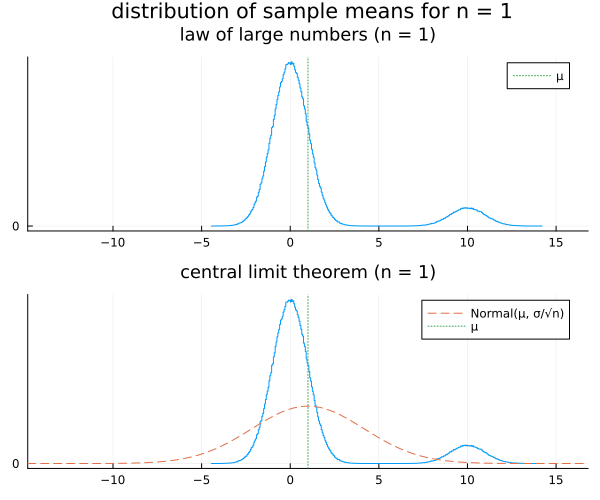

In [6]:
plot_lln_clt(; dist = MixtureModel([Normal(), Normal(10)], [0.9, 0.1]))

  5.077389 seconds (5.00 M allocations: 396.737 MiB)
 54.579007 seconds (27.27 M allocations: 15.200 GiB, 2.05% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
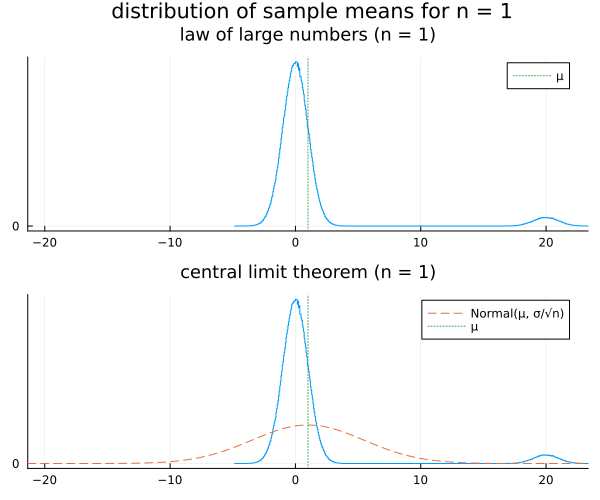

In [7]:
plot_lln_clt(; dist = MixtureModel([Normal(), Normal(20)], [0.95, 0.05]))

  7.236235 seconds (187.35 k allocations: 12.621 MiB, 164.85% compilation time)
 34.924595 seconds (13.34 M allocations: 5.387 GiB, 2.01% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
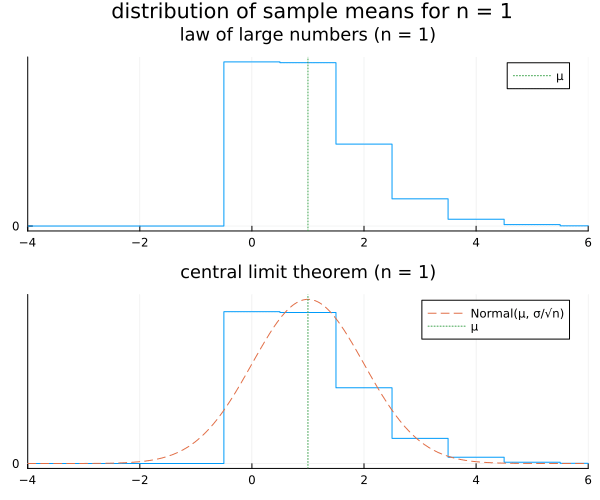

In [8]:
plot_lln_clt(; dist = Poisson(1))

  3.122429 seconds (128.34 k allocations: 8.644 MiB, 573.68% compilation time)
 32.676772 seconds (11.87 M allocations: 5.352 GiB, 1.36% gc time)

[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
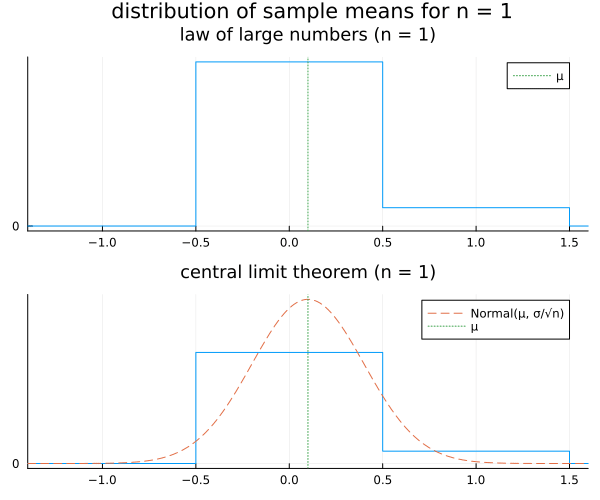

In [9]:
plot_lln_clt(; dist = Bernoulli(0.1))

In [10]:
using Distributions

function meanvarstdskku(dist)
    m = mean(dist)
    s2 = var(dist)
    s = √s2
    sk = skewness(dist)
    ku = kurtosis(dist)
    m, s2, s, sk, ku
end

function meanvarstdskku(dist::MixtureModel)
    M1, M2, M3, M4 = moment1234(dist)
    m = mean(dist)
    s2 = var(dist)
    s = √s2
    s3, s4 = s*s2, s2^2
    sk = 1/s3 * (M3 - 3m*s2 - m^3)
    ku = 1/s4 * (M4 - 4m*s3*sk - 6m^2*s2 - m^4) - 3
    m, s2, s, sk, ku
end

function moment1234(dist)
    m, s2, s, sk, ku = meanvarstdskku(dist)
    s3, s4 = s*s2, s2^2
    m1 = m
    m2 = s2 + m^2
    m3 = s3*sk + 3m*s2 + m^3
    m4 = s4*(ku + 3) + 4m*s3*sk + 6m^2*s2 + m^4
    m1, m2, m3, m4
end

function moment1234(dist::MixtureModel)
    T = float(eltype(dist))
    M1, M2, M3, M4 = zero(T), zero(T), zero(T), zero(T)
    for (d, q) in zip(components(dist), probs(dist))
        m1, m2, m3, m4 = moment1234(d)
        M1 += q * m1
        M2 += q * m2
        M3 += q * m3
        M4 += q * m4
    end
    M1, M2, M3, M4
end

# Warning: type piracy
Distributions.skewness(dist::MixtureModel) = meanvarstdskku(dist)[4]
Distributions.kurtosis(dist::MixtureModel) = meanvarstdskku(dist)[5]

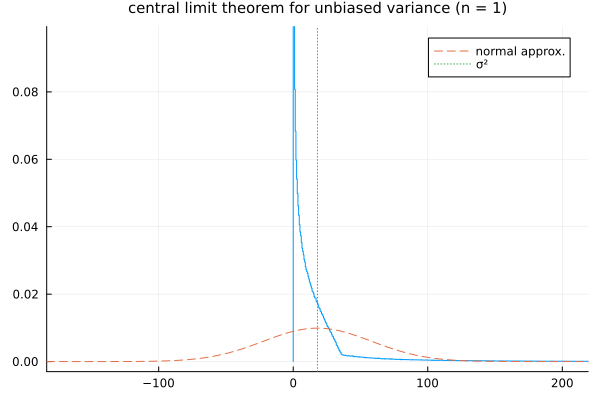

In [11]:
dist = Gamma(2, 3)
μ, σ = mean(dist), std(dist)
sk, ku = skewness(dist), kurtosis(dist)
n = 1

L = 10^6
S² = [(X = rand(dist, n); n == 1 ? (X[1] - μ)^2 : var(X)) for i in 1:L]

std_S² = σ^2 * √(ku/n + 2/max(1, n-1))
#alpha = σ^4/std_S²^2
#theta = std_S²^2/σ^2
stephist(S²; norm=true, label="")
plot!(xlim=(σ^2-m*std_S², σ^2+m*std_S²))
plot!(Normal(σ^2, std_S²), σ^2-m*std_S², σ^2+m*std_S²; label="normal approx.", ls=:dash)
vline!([σ^2]; label="σ²", ls=:dot)
#plot!(Gamma(alpha, theta), σ^2-m*std_S², σ^2+m*std_S²; label="gamma aprrox.", ls=:dashdot)
title!("central limit theorem for unbiased variance (n = $n)"; titlefontsize=10)
if n == 1 ymax = 4/std_S²; plot!(ylim=(-0.03ymax, ymax)) end
#plot!(ytick=[0])

In [12]:
using Distributions
using Random
using StatsPlots
default(fmt=:png)

function plot_lln_clt_meanvar2x2(; dist=Gamma(2, 3), m=5, nbin=200, nns=200, L=10^6)
    μ, σ = mean(dist), std(dist)
    sk, ku = skewness(dist), kurtosis(dist)
    ns = round.(Int, exp.(range(log(1), log(1000), nns)))
    nmax = maximum(ns)

    X̄ = zeros(L, length(ns))
    S² = zeros(L, length(ns))
    Xtmp = [zeros(eltype(dist), nmax) for _ in 1:Threads.nthreads()]
    @time Threads.@threads for i in 1:L
        X = rand!(dist, Xtmp[Threads.threadid()])
        for (j, n) in enumerate(ns)
            XX = @view X[1:n]
            X̄[i, j] = mean(XX)
            S²[i, j] = n == 1 ? (XX[1] - μ)^2 : var(XX)
        end
    end

    js = collect(eachindex(ns))
    js_gif = [fill(js[1], 40); js; fill(js[end], 40)]
    ns_gif = ns[js_gif]
    
    @time @gif for (j, n) in zip(js_gif, ns_gif)
        bin = if dist isa DiscreteUnivariateDistribution
            binmin, binmax = floor(n*(μ-m*σ/√n))/n, ceil(n*(μ+m*σ/√n))/n
            binstep = max(1, round(n*(binmax - binmin)/nbin))/n
            binmin-binstep/2:binstep:binmax+binstep/2
        else
            :auto
        end
        
        P1 = stephist(@view(X̄[:, j]); norm=true, bin, label="")
        plot!(xlim=(μ-m*σ, μ+m*σ))
        vline!([μ]; label="μ", ls=:dot, c=3)
        title!("law of large numbers for sample mean (n=$n)"; titlefontsize=10)
        plot!(ytick=[0])

        Q1 = stephist(@view(X̄[:, j]); norm=true, bin, label="")
        plot!(xlim=(μ-m*σ/√n, μ+m*σ/√n))
        plot!(Normal(μ, σ/√n), μ-m*σ/√n, μ+m*σ/√n; label="Normal(μ, σ/√n)", ls=:dash)
        vline!([μ]; label="μ", ls=:dot)
        title!("central limit theorem for sample mean (n=$n)"; titlefontsize=10)
        plot!(ytick=[0])
        
        P2 = stephist(@view(S²[:, j]); norm=true, label="")
        plot!(xlim=(σ^2-m*σ^2*√(ku+2), σ^2+m*σ^2*√(ku+2)))
        vline!([σ^2]; label="σ²", ls=:dot, c=3)
        title!("law of large numbers for unbiased variance (n = $n)"; titlefontsize=9)
        if n == 1 ymax = 4/(σ^2*√(ku+2)); plot!(ylim=(-0.03ymax, ymax)) end
        plot!(ytick=[0])

        std_S² = σ^2 * √(ku/n + 2/max(1, n-1))
        #alpha = σ^4/std_S²^2
        #theta = std_S²^2/σ^2
        Q2 = stephist(@view(S²[:, j]); norm=true, label="")
        plot!(xlim=(σ^2-m*std_S², σ^2+m*std_S²))
        plot!(Normal(σ^2, std_S²), σ^2-m*std_S², σ^2+m*std_S²; label="normal approx.", ls=:dash)
        vline!([σ^2]; label="σ²", ls=:dot)
        #plot!(Gamma(alpha, theta), σ^2-m*std_S², σ^2+m*std_S²; label="gamma aprrox.", ls=:dashdot)
        title!("central limit theorem for unbiased variance (n = $n)"; titlefontsize=9)
        if n == 1 ymax = 4/std_S²; plot!(ylim=(-0.03ymax, ymax)) end
        plot!(ytick=[0])
        
        plot(P1, P2, Q1, Q2; size=(800, 500), layout=(2, 2))
    end
end

plot_lln_clt_meanvar2x2 (generic function with 1 method)

  7.472922 seconds (113.21 k allocations: 7.662 MiB, 62.62% compilation time)
 99.522731 seconds (62.22 M allocations: 26.735 GiB, 12.80% gc time, 1.26% compilation time: 71% of which was recompilation)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
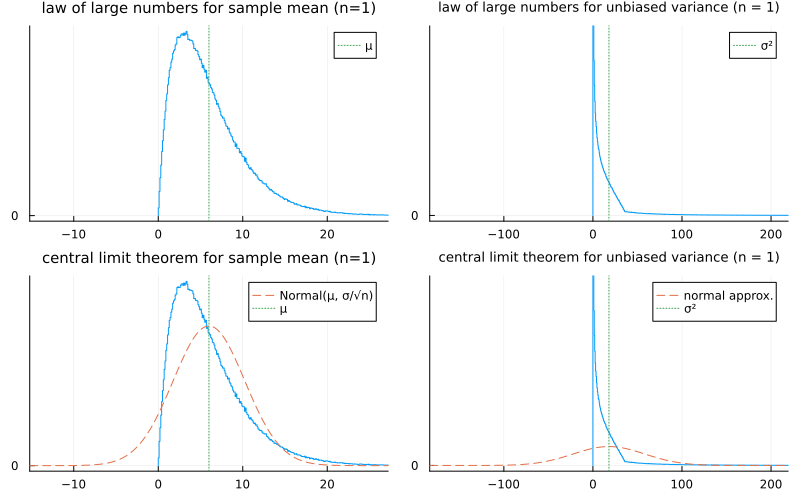

In [13]:
plot_lln_clt_meanvar2x2(; dist=Gamma(2, 3))

  7.170230 seconds (5.07 M allocations: 401.642 MiB, 9.54% compilation time)
 87.980399 seconds (103.49 M allocations: 27.559 GiB, 2.30% gc time)


[ Info: Saved animation to D:\OneDrive\public\0044\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0044\\tmp.gif")
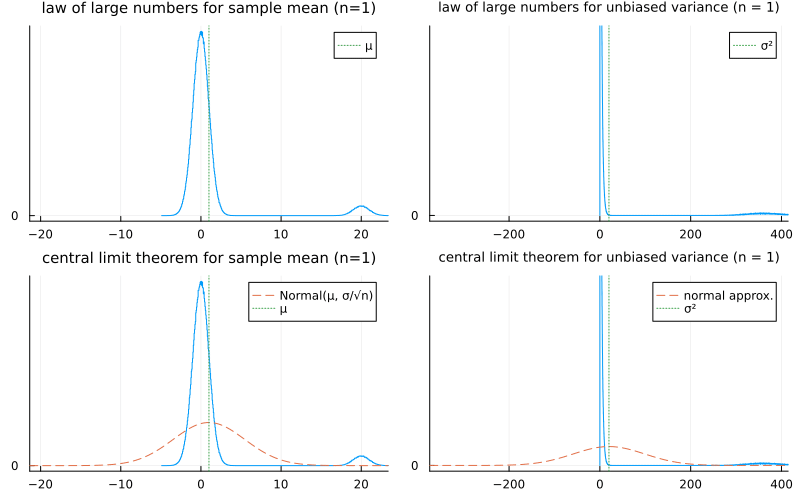

In [14]:
plot_lln_clt_meanvar2x2(; dist=MixtureModel([Normal(), Normal(20)], [0.95, 0.05]))